In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import datetime as dt
import matplotlib.pyplot as plt
from plotly.offline import init_notebook_mode
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import warnings
warnings.filterwarnings('ignore')
#plt.style.use('dark_background')
pd.set_option('display.max_columns',None)

In [2]:
df = pd.read_csv('Life Expectancy Data.csv')

In [3]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [4]:
df.shape

(2938, 22)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [6]:
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

## Missing Value Imputation

In [7]:
def impute_central_tendency(df,feature):
    print("Choose a measure of central tendency to fill null values:")
    print("1. Mean")
    print("2. Median")
    print("3. Mode")

    choice = input("Enter your choice (1/2/3): ")

    if choice not in ['1', '2', '3']:
        print("Invalid choice! Please enter a valid choice.")

    choice = int(choice)

    if choice == 1:
        central_tendency = df[feature].mean()
        central_tendency_name = 'Mean'
    elif choice == 2:
        central_tendency = df[feature].median()
        central_tendency_name = 'Median'
    elif choice == 3:
        central_tendency = df[feature].mode().iloc[0]
        central_tendency_name = 'Mode'

    df[feature + '_filled_with_' + central_tendency_name] = df[feature].fillna(central_tendency)

    print(f"Null values in '{feature}' column filled with {central_tendency}.")
    print(f"Null values in '{feature}' filled sucessfully!")
    

In [8]:
def impute_random_sample(df, feature):
    df[feature+"_random"] = df[feature]
    random_sample = df[feature].dropna().sample(df[feature].isnull().sum(), random_state=0)
    random_sample.index = df[df[feature].isnull()].index
    df.loc[df[feature].isnull(), feature+'_random'] = random_sample

    print(f"Null values in '{feature}' filled sucessfully!")
    

In [9]:
def impute_nan_importance(df,feature):
    df[feature+'_importance']=np.where(df[feature].isnull(),1,0)
    print("Choose a measure of central tendency to fill null values:")
    print("1. Mean")
    print("2. Median")
    print("3. Mode")

    choice = input("Enter your choice (1/2/3): ")

    if choice not in ['1', '2', '3']:
        print("Invalid choice! Please enter a valid choice.")

    choice = int(choice)

    if choice == 1:
        central_tendency = df[feature].mean()
        central_tendency_name = 'Mean'
    elif choice == 2:
        central_tendency = df[feature].median()
        central_tendency_name = 'Median'
    elif choice == 3:
        central_tendency = df[feature].mode().iloc[0]
        central_tendency_name = 'Mode'

    df[feature + '_filled_with_' + central_tendency_name] = df[feature].fillna(central_tendency)

    print(f"Null values in '{feature}' filled sucessfully!")
    

In [10]:
def impute_end_distribution(df,feature):
    extreme = df[feature].mean() + 3*df[feature].std()
    df[feature+"_end_dist"] = df[feature].fillna(extreme)
    print(f"Null values in '{feature}' filled sucessfully!")
   

### for categorical

In [11]:
def impute_frequent(df,feature):
    frequent = df[feature].mode()[0]
    df[feature+'_frequent'] = df[feature].fillna(frequent,inplace=True)
    
    print(f"Null values in '{feature}' filled sucessfully!")
    

In [12]:
def impute_frequent_importance(df,feature):
    df[feature+'_frequent_importance']= np.where(df[feature].isnull(),1,0)
    frequent = df[feature].mode()[0]
    df[feature+'_frequent'] = df[feature].fillna(frequent,inplace=True)
    
    print(f"Null values in '{feature}' filled sucessfully!")
    

## Handling Categorical Values

In [13]:
def encode_target_guided(df,feature,target):
    ordinal_labels=df.groupby([feature])[target].mean().sort_values().index
    enu = {k:i for i,k in enumerate(ordinal_labels,0)}
    df[feature+'_targuided']=df[feature].map(enu)
    # Drop the original feature
    df.drop(columns=[feature], inplace=True)

In [14]:
def encode_mean(df,faeture,target):
    mean_ord = df.groupby([feature])[target].mean().to_dict()
    df[feature+'_mean'] = df[feature].map(mean_ord)
    # Drop the original feature
    df.drop(columns=[feature], inplace=True)

## Transformation

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

from sklearn.preprocessing import MinMaxScaler
minmax = MinMaxScaler()
df_scaled = minmax.fit_transform(df)

from sklearn.preprocessing import RobustScaler
robust = RobustScaler()
df_scaled  = robust.fit_transform(df)

### GAusian Transforamtion

In [15]:
def plot_data(df,feature):
    plt.figure(figsize=(10,6))
    plt.subplot(1,2,1)
    df[feature].hist()
    plt.subplot(1,2,2)
    stat.probplot(df[feature],dist='norm',plot=pylab)
    plt.show()

In [16]:
def log_trans(df,feature):
    df[feature+'_log'] = np.log(df[feature])

In [17]:
def reci_trans(df,feature):
    df[feature+'_reci'] = 1/df.feature

In [18]:
def sqrt_trans(df,feature):
    df[feature+'_sqrt'] = df.feature**(1/2)

In [19]:
def expo_trans(df,feature):
    df[feature+'_expo'] = df.feature**(1/1.2)

## Outlier

print("The lenght of data before outlier removal: {}".format(len(df)))

Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
df_1 = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

print("The lenght of data After outlier removal: {}".format(len(df_1)))  

## filling null values

In [20]:
impute_random_sample(df,"Polio")

Null values in 'Polio' filled sucessfully!


In [21]:
impute_random_sample(df," BMI ")

Null values in ' BMI ' filled sucessfully!


In [22]:
impute_random_sample(df, "Alcohol")


Null values in 'Alcohol' filled sucessfully!


In [23]:
impute_random_sample(df,"Hepatitis B")

Null values in 'Hepatitis B' filled sucessfully!


In [24]:
impute_random_sample(df,"Adult Mortality")

Null values in 'Adult Mortality' filled sucessfully!


In [25]:
impute_random_sample(df,"Total expenditure")

Null values in 'Total expenditure' filled sucessfully!


In [26]:
impute_random_sample(df,"GDP")

Null values in 'GDP' filled sucessfully!


In [27]:
impute_random_sample(df,"Population")

Null values in 'Population' filled sucessfully!


In [28]:
impute_random_sample(df,"Income composition of resources")

Null values in 'Income composition of resources' filled sucessfully!


In [29]:
impute_random_sample(df,"Schooling")

Null values in 'Schooling' filled sucessfully!


In [30]:
impute_random_sample(df, "Diphtheria ")

Null values in 'Diphtheria ' filled sucessfully!


In [31]:
impute_random_sample(df, " thinness 5-9 years")

Null values in ' thinness 5-9 years' filled sucessfully!


In [32]:
impute_random_sample(df, "Life expectancy ")

Null values in 'Life expectancy ' filled sucessfully!


In [33]:
impute_random_sample(df, " thinness  1-19 years")

Null values in ' thinness  1-19 years' filled sucessfully!


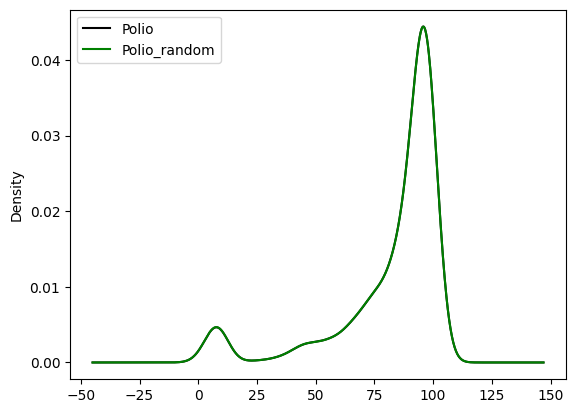

In [34]:
fig = plt.figure()
ax = fig.add_subplot(111)
df['Polio'].plot(kind='kde', ax=ax,color='black')
df.Polio_random.plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

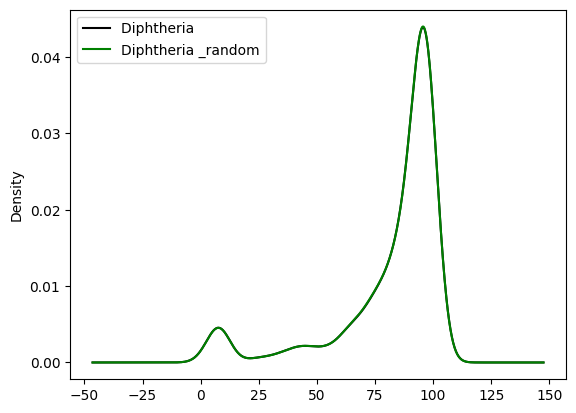

In [35]:
fig = plt.figure()
ax = fig.add_subplot(111)
df['Diphtheria '].plot(kind='kde', ax=ax,color='black')
df['Diphtheria _random'].plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

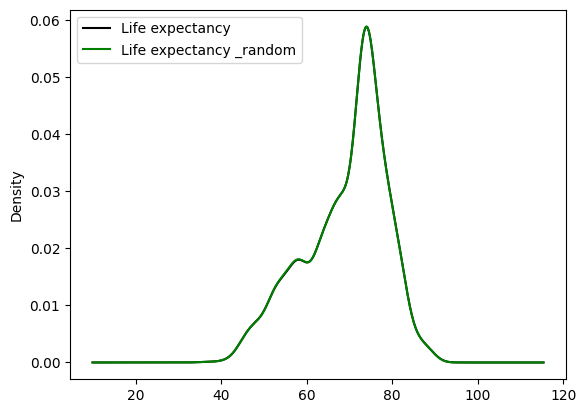

In [36]:
fig = plt.figure()
ax = fig.add_subplot(111)
df['Life expectancy '].plot(kind='kde', ax=ax,color='black')
df['Life expectancy _random'].plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

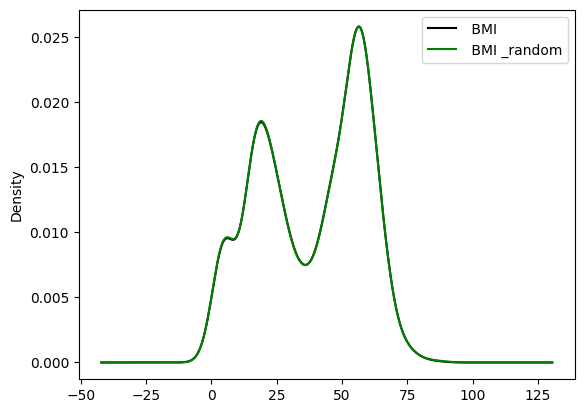

In [37]:
fig = plt.figure()
ax = fig.add_subplot(111)
df[' BMI '].plot(kind='kde', ax=ax,color='black')
df[' BMI _random'].plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

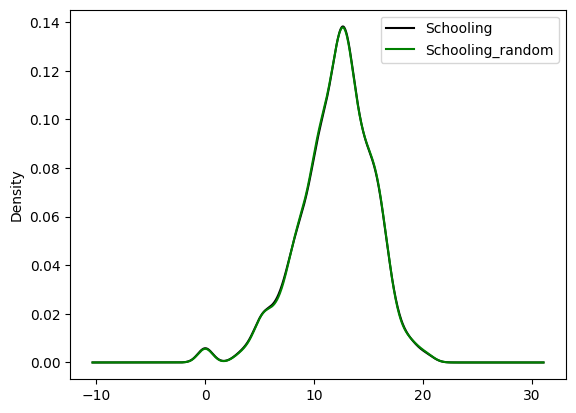

In [38]:
fig = plt.figure()
ax = fig.add_subplot(111)
df['Schooling'].plot(kind='kde', ax=ax,color='black')
df['Schooling_random'].plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

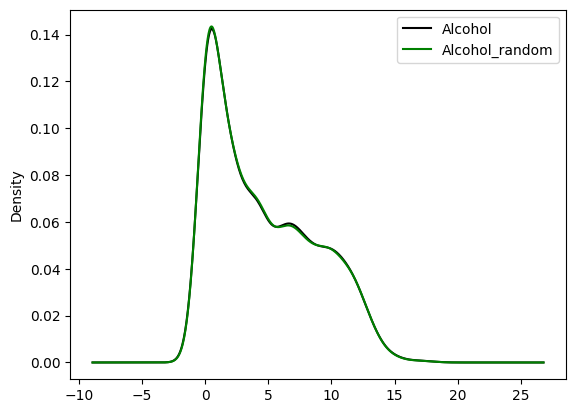

In [39]:
fig = plt.figure()
ax = fig.add_subplot(111)
df['Alcohol'].plot(kind='kde', ax=ax,color='black')
df.Alcohol_random.plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

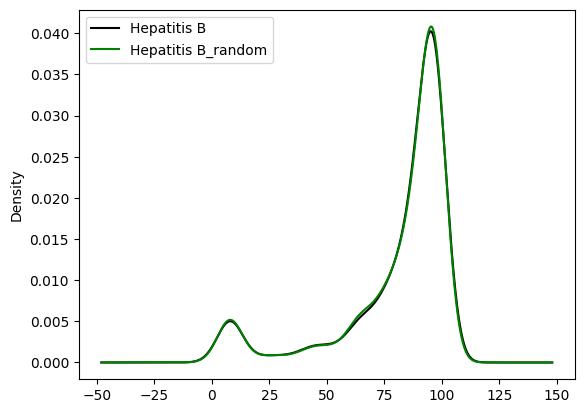

In [40]:
fig = plt.figure()
ax = fig.add_subplot(111)
df['Hepatitis B'].plot(kind='kde', ax=ax,color='black')
df['Hepatitis B_random'].plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

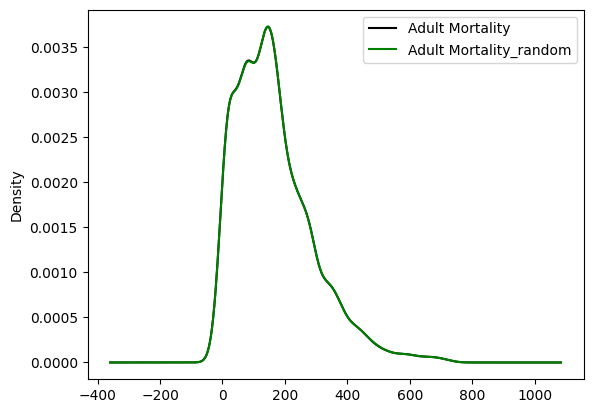

In [41]:
fig = plt.figure()
ax = fig.add_subplot(111)
df['Adult Mortality'].plot(kind='kde', ax=ax,color='black')
df['Adult Mortality_random'].plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

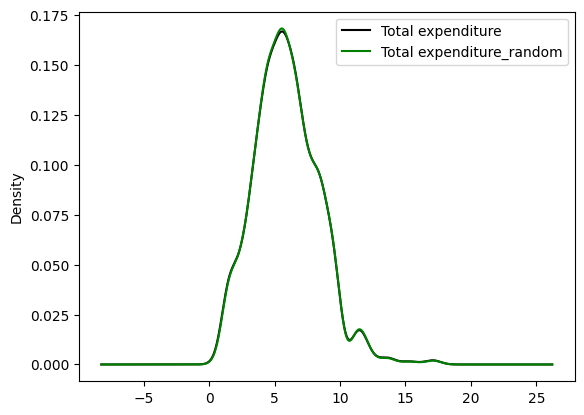

In [42]:
fig = plt.figure()
ax = fig.add_subplot(111)
df['Total expenditure'].plot(kind='kde', ax=ax,color='black')
df['Total expenditure_random'].plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

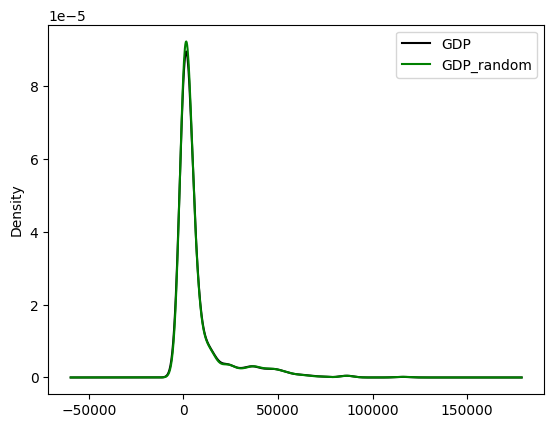

In [43]:
fig = plt.figure()
ax = fig.add_subplot(111)
df['GDP'].plot(kind='kde', ax=ax,color='black')
df['GDP_random'].plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

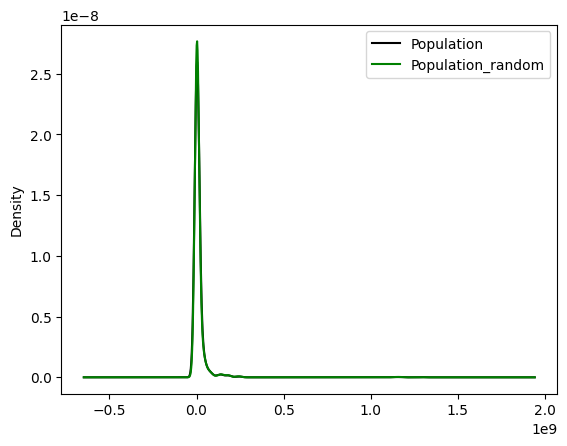

In [44]:
fig = plt.figure()
ax = fig.add_subplot(111)
df['Population'].plot(kind='kde', ax=ax,color='black')
df['Population_random'].plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

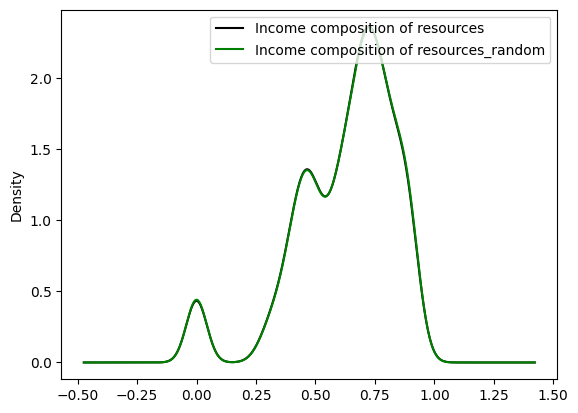

In [45]:
fig = plt.figure()
ax = fig.add_subplot(111)
df['Income composition of resources'].plot(kind='kde', ax=ax,color='black')
df['Income composition of resources_random'].plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')
plt.show()

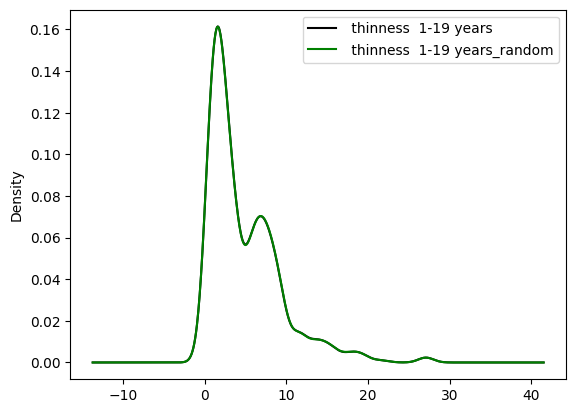

In [46]:
fig = plt.figure()
ax = fig.add_subplot(111)
df[' thinness  1-19 years'].plot(kind='kde', ax=ax,color='black')
df[' thinness  1-19 years_random'].plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

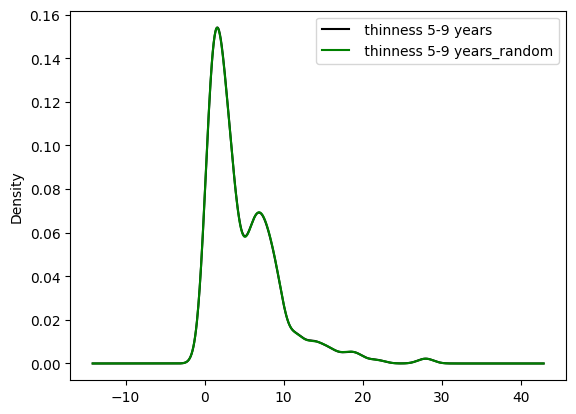

In [47]:
fig = plt.figure()
ax = fig.add_subplot(111)
df[' thinness 5-9 years'].plot(kind='kde', ax=ax,color='black')
df[' thinness 5-9 years_random'].plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')

In [48]:
def drop_features(df, features_to_drop):
    """
    Drops multiple features from a DataFrame.

    Parameters:
        df (DataFrame): The DataFrame from which features will be dropped.
        features_to_drop (list): A list of feature names to drop.

    Returns:
        DataFrame: The DataFrame with specified features dropped.
    """
    return df.drop(columns=features_to_drop, inplace=False)


In [49]:
features_to_drop = ['Alcohol','Hepatitis B', 'Total expenditure','GDP','Population','Income composition of resources','Schooling','Polio','Adult Mortality','Life expectancy ',' thinness  1-19 years',' thinness 5-9 years','Diphtheria ',' BMI ']
df = drop_features(df, features_to_drop)

In [50]:
fig = px.line(df.sort_values(by='Year'), 
              x='Year', 
              y='Life expectancy _random', 
              animation_frame='Country', 
              animation_group='Year', 
              color='Country', 
              markers=True, 
              template='plotly_dark', 
              title='<b> Country wise Life Expectancy over Years')

# Set the duration of each frame (in milliseconds) to slow down the animation
fig.update_layout(
    updatemenus=[dict(type="buttons", buttons=[dict(method="animate", args=[None, {"frame": {"duration": 10000}}])])])

fig.show()

In [51]:
px.scatter(df,y='Adult Mortality_random',x='Life expectancy _random',color='Country',size='Life expectancy _random',template='plotly_dark',opacity=0.6,title='<b> Life Expectancy Versus Adult Mortality')

In [52]:
fig = px.scatter(df.sort_values(by='Year'), 
                 y='GDP_random', 
                 x='Life expectancy _random', 
                 animation_frame='Year', 
                 animation_group='Country', 
                 template='plotly_dark', 
                 color='Country', 
                 size='Life expectancy _random', 
                 title='<b>Life Expectancy Versus GDP of Countries in every Year')

# Set the duration of each frame (in milliseconds) to slow down the animation
fig.update_layout(
    updatemenus=[
        dict(type="buttons", 
             buttons=[dict(method="animate", args=[None, {"frame": {"duration": 10000}, "fromcurrent": True}])]),
    ])

fig.show()


In [53]:
fig = px.scatter(df.sort_values(by='Year'), 
                 y='GDP_random', 
                 x='Life expectancy _random', 
                 animation_frame='Year', 
                 animation_group='Country', 
                 template='plotly_dark', 
                 color='Country', 
                 size='Life expectancy _random', 
                 title='<b>Life Expectancy Versus GDP of Countries in every Year')

# Set the duration of each frame (in milliseconds) to slow down the animation
fig.update_layout(
    updatemenus=[
        dict(type="buttons", 
             buttons=[dict(method="animate", args=[None, {"frame": {"duration": 10000}, "fromcurrent": True}])])
    ])

fig.show()


In [54]:
px.scatter(df.sort_values(by='Year'),y='infant deaths',x='Life expectancy _random',template='plotly_dark',size='Year',color='Country',opacity=0.6,title='<b>Life Expectancy Versus Infant Deaths of Countries in every Year')

In [55]:
px.scatter(df,x='Life expectancy _random',y='percentage expenditure',color='Country',size='Year',template='plotly_dark',title='<b> Life Expectancy Versus Percentage expenditure')

In [56]:
fig=px.violin(df,x='Status',y='Life expectancy _random',color='Status',template='plotly_dark',box=True,title='Life expectancy Based on Countries status')
fig.show()

In [57]:
encode_target_guided(df,'Country','Life expectancy _random')

In [58]:
encode_target_guided(df,'Status','Life expectancy _random')

In [59]:
df.isnull().sum()

Year                                      0
infant deaths                             0
percentage expenditure                    0
Measles                                   0
under-five deaths                         0
 HIV/AIDS                                 0
Polio_random                              0
 BMI _random                              0
Alcohol_random                            0
Hepatitis B_random                        0
Adult Mortality_random                    0
Total expenditure_random                  0
GDP_random                                0
Population_random                         0
Income composition of resources_random    0
Schooling_random                          0
Diphtheria _random                        0
 thinness 5-9 years_random                0
Life expectancy _random                   0
 thinness  1-19 years_random              0
Country_targuided                         0
Status_targuided                          0
dtype: int64

In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Year                                    2938 non-null   int64  
 1   infant deaths                           2938 non-null   int64  
 2   percentage expenditure                  2938 non-null   float64
 3   Measles                                 2938 non-null   int64  
 4   under-five deaths                       2938 non-null   int64  
 5    HIV/AIDS                               2938 non-null   float64
 6   Polio_random                            2938 non-null   float64
 7    BMI _random                            2938 non-null   float64
 8   Alcohol_random                          2938 non-null   float64
 9   Hepatitis B_random                      2938 non-null   float64
 10  Adult Mortality_random                  2938 non-null   floa

In [61]:
df.describe()

,Year,infant deaths,percentage expenditure,Measles,under-five deaths,HIV/AIDS,Polio_random,BMI _random,Alcohol_random,Hepatitis B_random,Adult Mortality_random,Total expenditure_random,GDP_random,Population_random,Income composition of resources_random,Schooling_random,Diphtheria _random,thinness 5-9 years_random,Life expectancy _random,thinness 1-19 years_random,Country_targuided,Status_targuided
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2.938000e+03,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000
mean,2007.518720,30.303948,738.251295,2419.592240,42.035739,1.742103,82.519401,38.282097,4.585174,80.824711,164.964602,5.936392,7424.707310,1.275967e+07,0.628251,12.009769,82.343431,4.868754,69.213104,4.839108,97.021103,0.174268
std,4.613841,117.926501,1987.914858,11467.272489,160.445548,5.077785,23.464716,20.076576,4.046275,25.069198,124.324827,2.482409,14189.379734,5.949259e+07,0.211427,3.339612,23.667401,4.507815,9.521443,4.419409,55.912521,0.379405
min,2000.000000,0.000000,0.000000,0.000000,0.000000,0.100000,3.000000,1.000000,0.010000,1.000000,1.000000,0.370000,1.681350,3.400000e+01,0.000000,0.000000,2.000000,0.100000,36.300000,0.100000,0.000000,0.000000
25%,2004.000000,0.000000,4.685343,0.000000,0.000000,0.100000,78.000000,19.300000,0.862500,76.000000,74.000000,4.262500,464.195927,1.973152e+05,0.494000,10.100000,78.000000,1.500000,63.100000,1.600000,49.000000,0.000000
50%,2008.000000,3.000000,64.912906,17.000000,4.000000,0.100000,93.000000,43.400000,3.715000,92.000000,144.000000,5.730000,1813.390335,1.374823e+06,0.678000,12.300000,93.000000,3.300000,72.100000,3.300000,97.000000,0.000000
75%,2012.000000,22.000000,441.534144,360.250000,28.000000,0.800000,97.000000,56.200000,7.680000,97.000000,228.000000,7.480000,5851.675333,7.289765e+06,0.780000,14.300000,97.000000,7.200000,75.600000,7.200000,146.000000,0.000000
max,2015.000000,1800.000000,19479.911610,212183.000000,2500.000000,50.600000,99.000000,87.300000,17.870000,99.000000,723.000000,17.600000,119172.741800,1.293859e+09,0.948000,20.700000,99.000000,28.600000,89.000000,27.700000,192.000000,1.000000


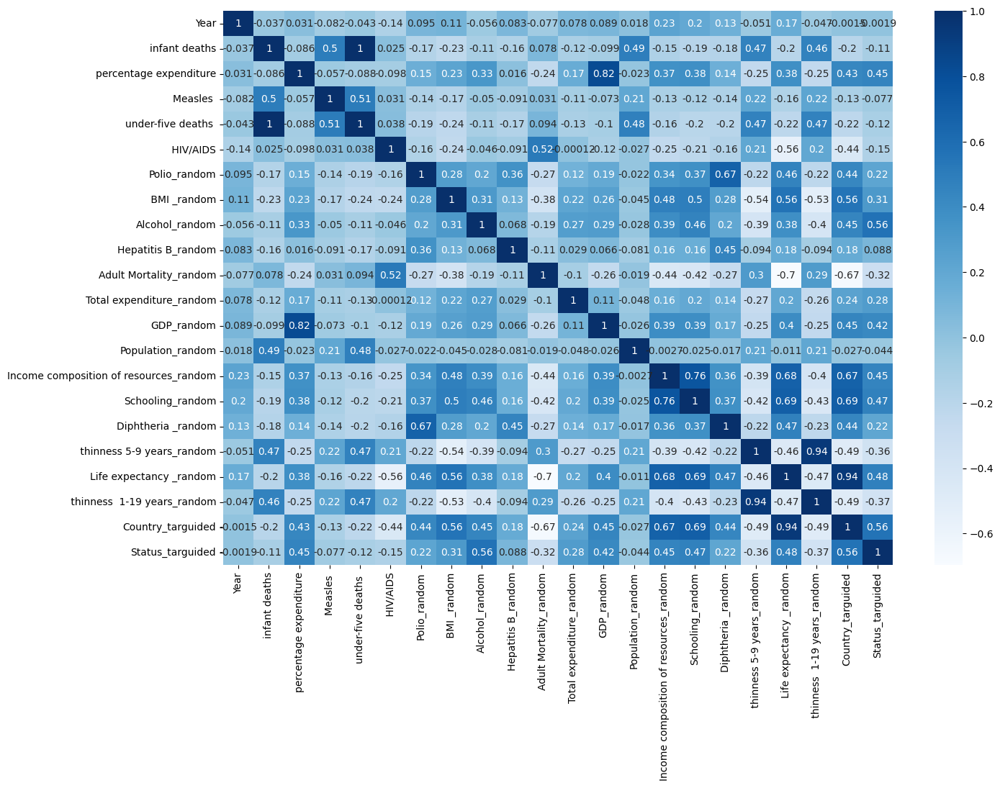

In [62]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot=True,cmap='Blues')
plt.show()

In [63]:
fig=px.histogram(df,x='Life expectancy _random',template='plotly_dark')
fig.show()

In [64]:
from sklearn.preprocessing import MinMaxScaler
minmax = MinMaxScaler() 
data_1 = minmax.fit_transform(df)

In [65]:
data = pd.DataFrame(data_1,columns=df.columns)

In [66]:
data.drop_duplicates(inplace=True)

In [67]:
features_to_drop = ['Country_targuided','Year']
data = drop_features(data, features_to_drop)

In [68]:
X = data.drop(columns='Life expectancy _random')
y = data['Life expectancy _random']

In [69]:
from sklearn.model_selection import train_test_split

In [70]:
X_train,X_test,y_train,y_test = train_test_split(X,y,random_state=5,test_size=0.2)

In [71]:
models = [
    LinearRegression(),
    DecisionTreeRegressor(),
    RandomForestRegressor(),
    GradientBoostingRegressor(),
    ExtraTreesRegressor(),
]
for model in models:
    model.fit(X_train, y_train)
    #y_tr= model.predict(X_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test,y_pred)
    mae = mean_absolute_error(y_test,y_pred)
    r2 = r2_score(y_test,y_pred)
    #print(f"Model: {type(model).__name__}, mse: {mse}")
    #print(f"Model: {type(model).__name__}, mae: {mae}")
    print(f"Model: {type(model).__name__}, r2: {r2}")

Model: LinearRegression, r2: 0.8185645760157532
Model: DecisionTreeRegressor, r2: 0.9142414465805904
Model: RandomForestRegressor, r2: 0.9527880272856502
Model: GradientBoostingRegressor, r2: 0.9386032896255173
Model: ExtraTreesRegressor, r2: 0.9615123512491324


In [72]:
# Comparison of Predicted vs True Values
class ModelComparisonPlot:
    def __init__(self, model_name):
        self.model_name = model_name
    
    def plot_comparison(self, y_test, y_pred, mse, mae, r2):
        fig, axes = plt.subplots(1, 1, figsize=(11, 5))

        # Plot the predicted vs true values
        sns.regplot(x=y_test, y=y_pred, color='red', scatter_kws={'alpha':0.5}, ax=axes,line_kws={'color': 'blue'})
        axes.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
        axes.set_xlabel('True values', fontsize=12)
        axes.set_ylabel('Predicted values', fontsize=12)
        #axes.set_title('Predicted vs true values')
        axes.grid(color='green', linestyle='--', linewidth=0.5)
        fig.suptitle('Comparison of Predicted vs True Values and Residual Plot\n{}'.format(self.model_name), fontsize=15)
        plt.subplots_adjust(wspace=0.4)
        plt.show()

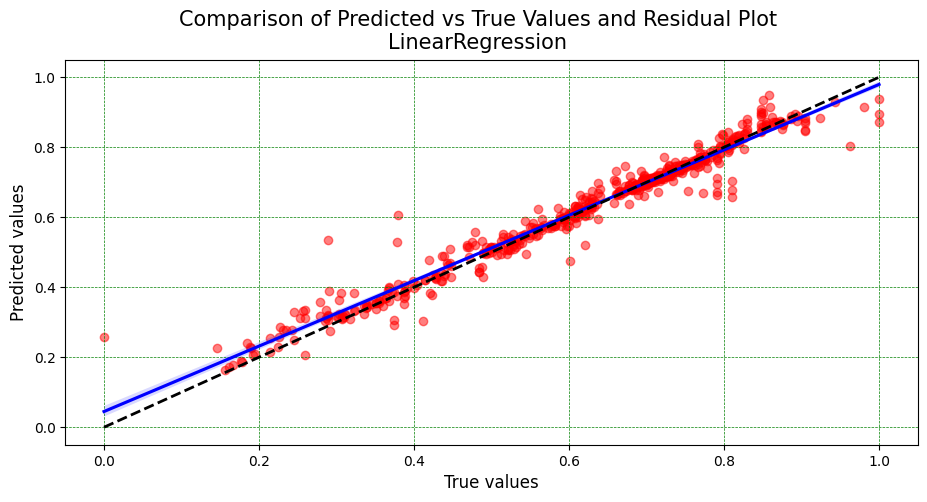

In [73]:
# Create instances of ModelComparisonPlot for each model
model_LR_plot = ModelComparisonPlot('LinearRegression')
# Plot comparison for each model
model_LR_plot.plot_comparison(y_test, y_pred, mse, mae, r2)

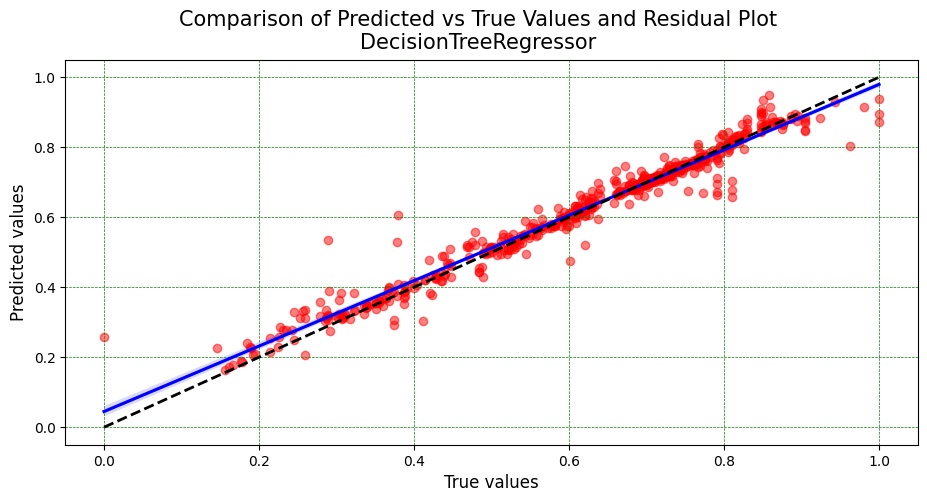

In [74]:
model_DTR_plot = ModelComparisonPlot('DecisionTreeRegressor')
model_DTR_plot.plot_comparison(y_test, y_pred, mse, mae, r2)

In [75]:
model_RFR = RandomForestRegressor(max_depth= 10, max_features= None, min_samples_leaf= 1, min_samples_split= 2, n_estimators= 300)
model_RFR.fit(X_train, y_train)
y_pred = model_RFR.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Model: {type(model_RFR).__name__}, mse: {mse}")
print(f"Model: {type(model_RFR).__name__}, mae: {mae}")
print(f"Model: {type(model_RFR).__name__}, r2: {r2}")

Model: RandomForestRegressor, mse: 0.0015701797090160506
Model: RandomForestRegressor, mae: 0.02523370215840507
Model: RandomForestRegressor, r2: 0.9516709519931841


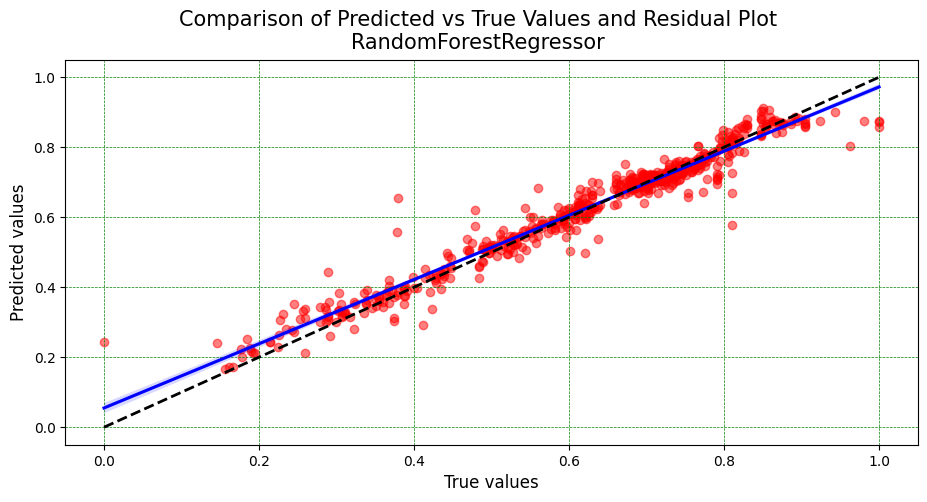

In [76]:
model_DTR_plot = ModelComparisonPlot('RandomForestRegressor')
model_DTR_plot.plot_comparison(y_test, y_pred, mse, mae, r2)

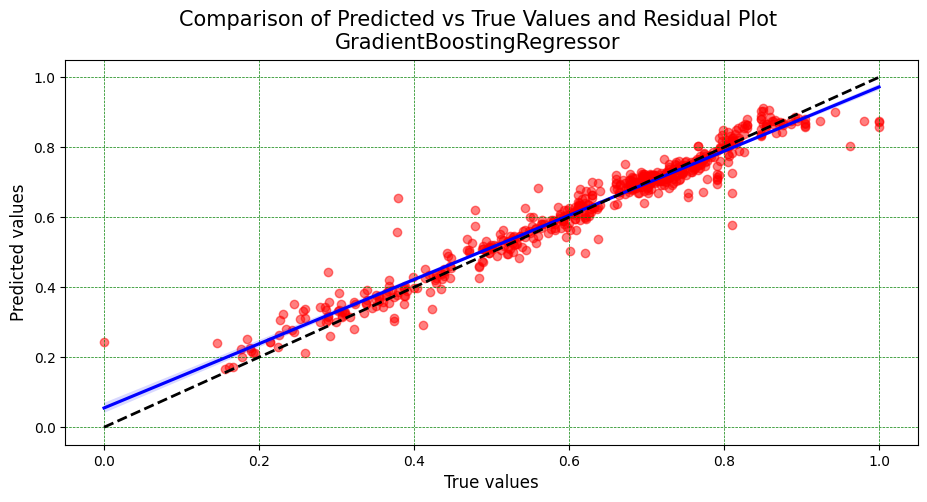

In [77]:
model_DTR_plot = ModelComparisonPlot('GradientBoostingRegressor')
model_DTR_plot.plot_comparison(y_test, y_pred, mse, mae, r2)

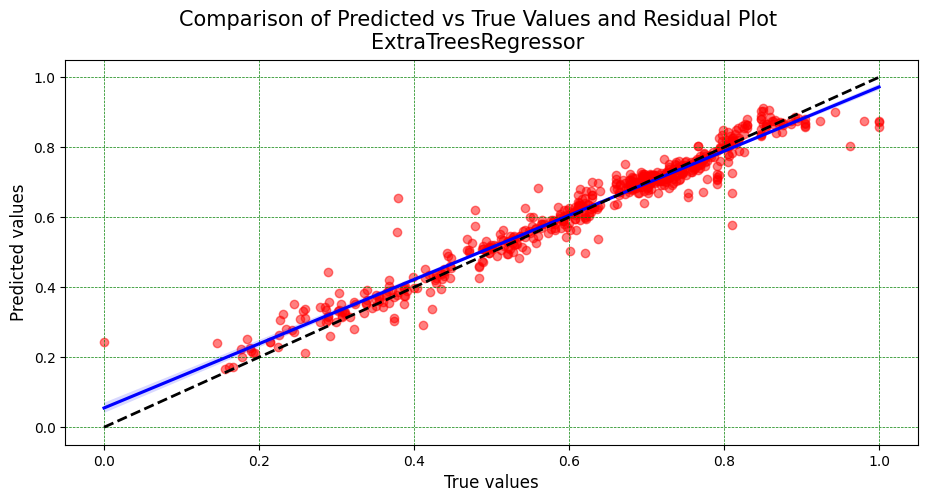

In [78]:
model_DTR_plot = ModelComparisonPlot('ExtraTreesRegressor')
model_DTR_plot.plot_comparison(y_test, y_pred, mse, mae, r2)

In [79]:
featimp = pd.Series(model.feature_importances_).sort_values(ascending=False)

In [80]:
featimp

9     0.298996
13    0.206229
4     0.144693
14    0.075832
6     0.069930
18    0.046830
5     0.037664
15    0.022892
17    0.021670
16    0.016630
3     0.011431
0     0.010148
7     0.009943
1     0.007216
10    0.006173
11    0.005138
8     0.003147
12    0.002727
2     0.002710
dtype: float64

In [81]:
etr= ExtraTreesRegressor(max_depth= None, max_features= None, min_samples_leaf= 1, min_samples_split= 2, n_estimators= 300)
etr.fit(X_train, y_train)
y_pred = etr.predict(X_test)
r2 = r2_score(y_test,y_pred)
print(" r2 score: {:.2f}%".format(r2 * 100))

 r2 score: 96.06%


In [82]:
featimp = pd.Series(etr.feature_importances_).sort_values(ascending=False)

In [83]:
featimp*100

13    27.168602
9     25.805053
4     11.466147
14     7.573436
6      7.148001
18     5.424361
15     2.843568
5      2.709823
17     2.028244
16     1.953142
3      1.160739
7      1.057543
0      0.936886
1      0.738470
10     0.637133
11     0.490323
8      0.314744
2      0.274465
12     0.269319
dtype: float64

In [84]:
data.head()

,infant deaths,percentage expenditure,Measles,under-five deaths,HIV/AIDS,Polio_random,BMI _random,Alcohol_random,Hepatitis B_random,Adult Mortality_random,Total expenditure_random,GDP_random,Population_random,Income composition of resources_random,Schooling_random,Diphtheria _random,thinness 5-9 years_random,Life expectancy _random,thinness 1-19 years_random,Status_targuided
0,0.034444,0.003659,0.005439,0.0332,0.0,0.031250,0.209733,0.0,0.653061,0.362881,0.452118,0.004889,0.026074,0.505274,0.487923,0.649485,0.603509,0.544592,0.619565,0.0
1,0.035556,0.003774,0.002319,0.0344,0.0,0.572917,0.203940,0.0,0.622449,0.373961,0.453279,0.005127,0.000253,0.502110,0.483092,0.618557,0.610526,0.447818,0.630435,0.0
2,0.036667,0.003759,0.002027,0.0356,0.0,0.614583,0.198146,0.0,0.642857,0.369806,0.450377,0.005287,0.024525,0.495781,0.478261,0.639175,0.617544,0.447818,0.637681,0.0
3,0.038333,0.004014,0.013135,0.0372,0.0,0.666667,0.192352,0.0,0.673469,0.375346,0.473012,0.005608,0.002857,0.488397,0.473430,0.670103,0.628070,0.440228,0.644928,0.0
4,0.039444,0.000364,0.014200,0.0388,0.0,0.677083,0.187717,0.0,0.683673,0.379501,0.435287,0.000519,0.002302,0.478903,0.458937,0.680412,0.635088,0.434535,0.655797,0.0


In [85]:
from sklearn.model_selection import train_test_split
x = data[['infant deaths','under-five deaths ',' HIV/AIDS','Polio_random',' BMI _random','Adult Mortality_random','Income composition of resources_random','Schooling_random','Diphtheria _random',' thinness 5-9 years_random',' thinness  1-19 years_random','Status_targuided']]
y = data['Life expectancy _random']
X_train,X_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=5)

In [86]:
et= ExtraTreesRegressor(max_depth= None, max_features= None, min_samples_leaf= 1, min_samples_split= 2, n_estimators= 300)
et.fit(X_train, y_train)
y_pred = et.predict(X_test)
r2 = r2_score(y_test,y_pred)
print(" r2 score: {:.2f}%".format(r2 * 100))

 r2 score: 96.18%


In [87]:
import pickle
pickle.dump(x,open('5_best.pkl','wb'))
pickle.dump(et,open('life2.pkl','wb'))

In [88]:
print(et.predict([[0.035556,0.0344,0.0,0.572917,0.203940,0.373961,0.502110,0.483092,0.618557,0.610526,0.630435,0.0]]))

[0.44781784]
